<h1 style="text-align: center;">Notebook for Fully connected Network</h1>
<p style="text-align: center;">We feed a fully connected network with PCA modes</p>


In [1]:
import numpy as np
import torch
import modred as mr
import os
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
import imageio
import os
import POD
import importlib
importlib.reload(POD)

import data_analysis
importlib.reload(data_analysis)

import autoencoder_analysis
importlib.reload(autoencoder_analysis)

import fcnn
importlib.reload(fcnn)

import utils
importlib.reload(utils)

import training
importlib.reload(training)

%matplotlib inline
matplotlib.pyplot.rc('text', usetex=True)

fontsize = 18

from data_analysis import Simulation
current_directory = '../'

In [2]:
from utils import get_freer_gpu

device = get_freer_gpu() if torch.cuda.is_available() else "cpu"

Selected GPU 1 with 48673 MB free memory 


In [3]:
lr = 1e-4
nc = 8
depth = 4
dynamics = None
pandey_data = False
Ra = 1e8
Lambda = 1e-2

def directory_to_chose(Ra, pandey_data, dynamics=None):
    directory = f'{current_directory}/results/fcnn/'


    if Ra == 1e8 and not pandey_data:
        directory += "new_architecture/"

    if Ra == 1e7 and not pandey_data:
        directory += "Ra1e7/"

    if Ra == 2e6 and not pandey_data:
        directory += "Ra2e6/"   

    if Ra == 2e6 and not pandey_data:
        directory += "Ra2e6/"   

    if pandey_data:
        directory += "pandey_data/"

    if dynamics is not None:
        if dynamics == "HC":
            directory = f"{current_directory}/results/fcnn/HCRa1e8"
        if dynamics == "pureRB":
            directory = f"{current_directory}/results/fcnn/pureRB"
        group = dynamics
    return directory

directory = directory_to_chose(Ra, pandey_data, dynamics)   
print(f"directory = {directory}")

directory = ..//results/fcnn/new_architecture/


# PCA

In [20]:
def compute_nmse_pca(X_reconstructed, X):

    outputs = X_reconstructed.flatten()
    targets = X.flatten()
    mse = torch.mean((outputs - targets)**2)
    mse_original = torch.mean(targets**2)
    nmse = mse / mse_original
    nmse = nmse.detach().cpu().numpy()

    return nmse


from training import compute_nmse
def NMSE_pca(Ra, Lambda):
    simulation = Simulation(current_directory, normalize=True, Lambda=Lambda, Ra=Ra)
    time_array, x, z, u, w, T, umean, wmean, Tmean = map(
        lambda x: torch.tensor(x).to(device), simulation.import_data(mean_type="Znorm")
    )
    n_min = min(simulation.m, simulation.h *simulation.l)
    X = torch.from_numpy(simulation.X).to(device)
    K_values_pca = [1,2,3,5,10,25,50,128,256,500,700, 800, 900,1000,2000,3000,4000, 5000,6249]
    NMSE_pca = []

    for K in K_values_pca:
        if K<=n_min:
            U,S,V = torch.pca_lowrank(X, q=K)
            X_reconstructed = U @ torch.diag(S) @ torch.conj(V).t()
            NMSE_pca.append(compute_nmse_pca(X_reconstructed, X).sum())

    
    K_normalized = np.array(K_values_pca) / n_min
    return(NMSE_pca, K_normalized)

In [22]:
NMSE_pca_pureRB

[0.42906064747830114,
 0.35302479116920854,
 0.27978426218151964,
 0.22625330971907354,
 0.14944829186123404,
 0.08449840877281849,
 0.05491639758951065,
 0.026312421065944887,
 0.01221070913967734,
 0.004424833979425244,
 0.0023521024327855054,
 0.001763832759455882,
 0.001343183275226114,
 0.0010337029214299107,
 9.58048958587255e-05,
 9.880108643498334e-06,
 9.945089633515716e-07]

In [19]:
K_values_pca = [1,2,3,5,10,25,50,128,256,500,700, 800, 900,1000,2000,3000,4000, 5000,6249]
Ra = 1e7
pandey_data = False
dynamics = None
Lambda = 1000.0
NMSE_pca_1e7, K_1e7 = NMSE_pca(Ra, Lambda)

Ra = 1e8
Lambda = 0.0
pandey_data = False
dynamics = "pureRB"
NMSE_pca_pureRB , K_pureRB = NMSE_pca(Ra, Lambda)

Ra = 1e8
Lambda = 1000.0
pandey_data = False
dynamics = "HC"
NMSE_pca_HC, K_HC = NMSE_pca(Ra, Lambda)

NMSE_pca_pandey = [0.8397808,
 0.66654605,
 0.57963425,
 0.4806404,
 0.29478014,
 0.12326638,
 0.0658477,
 0.0269837,
 0.010329466,
 0.0028513987,
 0.0012411893,
 0.0008557442,
 0.0006041422,
 0.00043264835,
 2.6054555e-05,
 2.457791e-06,
 2.6530844e-07,
 3.0333553e-08,
 2.1537498e-09,
 2.2370177e-10,
 6.8790923e-06]

K_pandey = np.array([1,2,3,5,10,25,50,128,256,500,700, 800, 900,1000,2000,3000,4000, 5000,6249, 10000, 11201])/11201

NMSE_pca = [0.6955067022099422,
 0.534258378184433,
 0.4788162951039174,
 0.384012560149645,
 0.2650543192957652,
 0.17675853251165086,
 0.13268473955185145,
 0.0798349404808474,
 0.04811016142633892,
 0.02372146050959682,
 0.014449388602148856,
 0.011468018362941972,
 0.00921345908739675,
 0.007460233096041027,
 0.0015754370770252833,
 0.0007733723048952257,
 0.0006104809422847851,
 0.000581256383121182,
 0.0005772931710731731]
K_mixed = np.array(K_values_pca)/6249


data from ..//data/bulk_L1000.0_Ra7.npz
X shape (2302, 12393)
data from ..//data/bulk_L0.0_Ra8.npz
X shape (10136, 12393)
data from ..//data/bulk_L1000.0_Ra8.npz
X shape (23724, 12393)


In [ ]:
print(NMSE_pca_1e7, K_1e7)

[0.7235098879841793, 0.5514432506847464, 0.4089384250083028, 0.2840230224616718, 0.20701978988730932, 0.11413900688181873, 0.058763626317196546, 0.01531089650869119, 0.0037501185716509434, 0.0005800106817641594, 0.00016712461183953853, 9.33100291938951e-05, 5.308778944163313e-05, 3.0315445419623775e-05, 8.28322522079632e-08] [4.34404865e-04 8.68809731e-04 1.30321460e-03 2.17202433e-03
 4.34404865e-03 1.08601216e-02 2.17202433e-02 5.56038228e-02
 1.11207646e-01 2.17202433e-01 3.04083406e-01 3.47523892e-01
 3.90964379e-01 4.34404865e-01 8.68809731e-01 1.30321460e+00
 1.73761946e+00 2.17202433e+00 2.71459600e+00]


In [ ]:
print(NMSE_pca_pureRB , K_pureRB)

[0.4290015448872811, 0.33738146187694523, 0.2767269350858706, 0.22435221369883093, 0.14848830739869445, 0.08549478844463228, 0.054857628922924354, 0.026302203828200345, 0.012217589852171045, 0.004415533565106083, 0.0023518368701492686, 0.0017671383990183276, 0.0013436024317490622, 0.001033568127226437, 9.583973272580362e-05, 9.879236986274342e-06, 9.951719671397141e-07] [2.42072137e-04 4.84144275e-04 7.26216412e-04 1.21036069e-03
 2.42072137e-03 6.05180344e-03 1.21036069e-02 3.09852336e-02
 6.19704672e-02 1.21036069e-01 1.69450496e-01 1.93657710e-01
 2.17864924e-01 2.42072137e-01 4.84144275e-01 7.26216412e-01
 9.68288550e-01 1.21036069e+00 1.51270879e+00]


In [ ]:
print(NMSE_pca_HC , K_HC)

[0.4290535159393211, 0.3371552586752909, 0.26483133035099, 0.22146501821614584, 0.148616499496206, 0.08544126256852462, 0.05476474440853547, 0.026356672909793155, 0.012173464942624461, 0.004421861848935891, 0.0023502840147464478, 0.0017664656243082505, 0.0013429595195635464, 0.0010337902252655514, 9.585186309601027e-05, 9.87865346085472e-06, 9.948311603605522e-07] [2.42072137e-04 4.84144275e-04 7.26216412e-04 1.21036069e-03
 2.42072137e-03 6.05180344e-03 1.21036069e-02 3.09852336e-02
 6.19704672e-02 1.21036069e-01 1.69450496e-01 1.93657710e-01
 2.17864924e-01 2.42072137e-01 4.84144275e-01 7.26216412e-01
 9.68288550e-01 1.21036069e+00 1.51270879e+00]


/tmp/ipykernel_1372995/1361089469.py:18: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(bottom = 0)


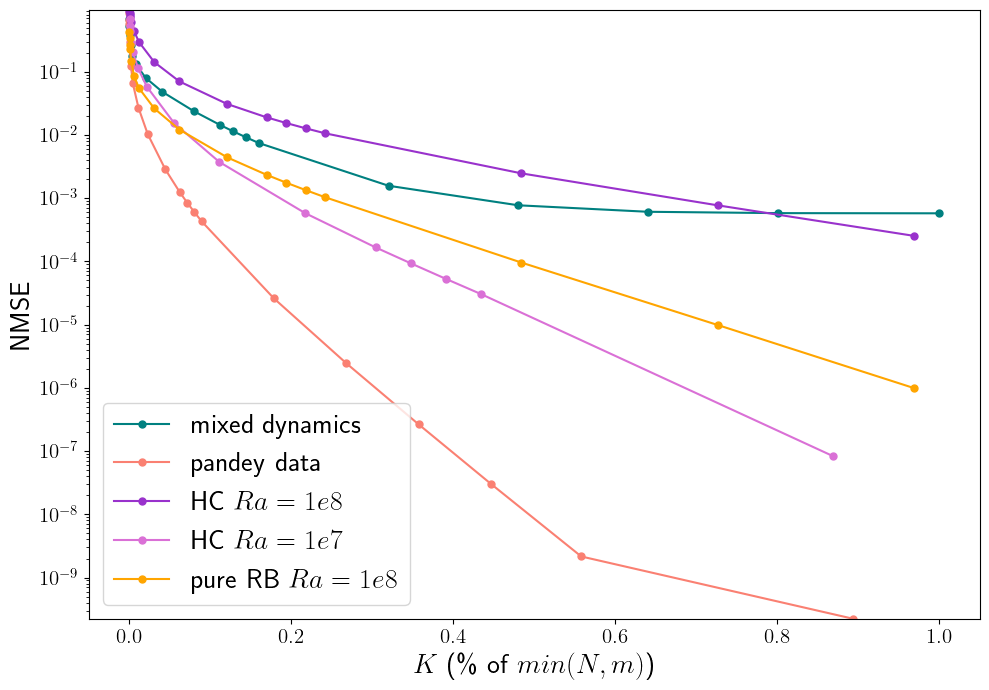

In [ ]:
fontsize = 20
fig, ax = plt.subplots(figsize = (10, 7)) 
ax.plot(np.array(K_values_pca)/6249, NMSE_pca, c = 'teal', markersize=10, marker = '.', linestyle='-', label = r"mixed dynamics")
ax.plot(K_pandey[:-1], NMSE_pca_pandey[:-1], c = 'salmon', markersize=10, marker = '.', linestyle='-', label = r"pandey data")
ax.plot(K_HC[:len(NMSE_pca_HC)],NMSE_pca_HC, c = 'darkOrchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e8$")
ax.plot(K_1e7[:len(NMSE_pca_1e7)], NMSE_pca_1e7, c = 'orchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e7$")
ax.plot(K_pureRB[:len(NMSE_pca_pureRB)], NMSE_pca_pureRB, c = 'orange', markersize=10, marker = '.', linestyle='-', label = r"pure RB $Ra = 1e8$")

# ax.set_title(r"Residual norm")
ax.set_ylabel(r"NMSE", fontsize = fontsize)
ax.set_xlabel(r'$K$ (\% of $min(N, m)$)', fontsize = fontsize)
ax.set_ylim(bottom = 0)

ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_yscale('log') 
# ax.set_xscale('log') 
ax.legend(fontsize = fontsize)
ax.set_ylim(bottom = 0)

# fig.suptitle(f'number of modes = {num_modes} ', fontsize = fontsize)
fig.tight_layout()

# results autoencoder

date: 2024-05-22 17:00:17.690851
batch_size: 4
Lambda: 0.01
thirty_min_epoch: None
num_epoch: 100
depth: 4
lr: 0.0001
weight_decay: 0
execution_time_in_min: 15.964675017197926
Q: 1000
epoch_1: {'loss': 0.005201179999858141, 'nmse': 0.2893808889389038, 'time': 0.18911496798197427, 'average_loss': 0.0031040985918680676, 'nmse_train': 0.4288869248239448}
epoch_2: {'loss': 0.004911109805107117, 'nmse': 0.2691905832290649, 'time': 0.37107459306716917, 'average_loss': 0.0019142871480723274, 'nmse_train': 0.26747758378132985}
epoch_3: {'loss': 0.005918221082538366, 'nmse': 0.24382333636283873, 'time': 0.5581188162167867, 'average_loss': 0.0016343836234763243, 'nmse_train': 0.23043510279648674}
epoch_4: {'loss': 0.004178161732852459, 'nmse': 0.2299991750717163, 'time': 0.7429578900337219, 'average_loss': 0.0014759882569434267, 'nmse_train': 0.20934291925827098}
epoch_5: {'loss': 0.003126076189801097, 'nmse': 0.22049013733863831, 'time': 0.9293178200721741, 'average_loss': 0.0013741217269615175

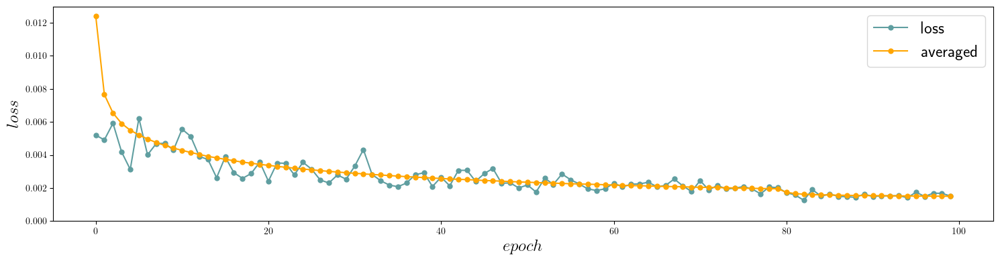

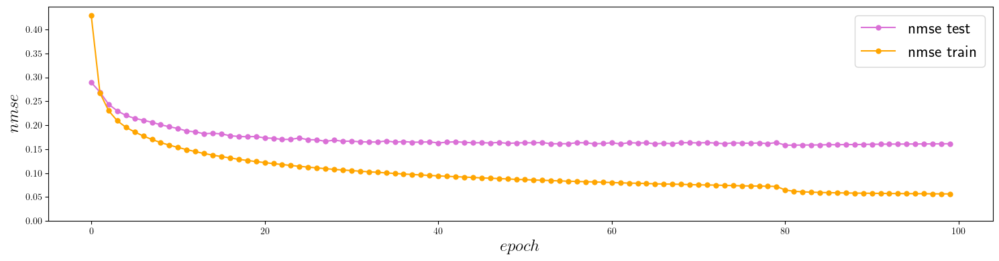

In [ ]:
batch_size = 4
K = 128
title = f'model_bs{batch_size}_K{K}_lr{lr}'
i = 0



from autoencoder_analysis import plot_info_training
plot_info_training(directory, title, i = i)


In [ ]:
batch_size = 4

K_values = [1, 2, 3, 5, 10, 25, 50, 128, 256, 500, 700, 800, 900, 1000]
# bs_values = [1, 2, 3, 4, 8, 16]
# directory = f'{current_directory}/results/fcnn/new_architecture/pca_only/'



i = 0



from autoencoder_analysis import get_variables_from_info_text
from utils import losses_from_info



print(directory)

def evaluate(directory, K_values, batch_size, lr):
    nmse_test = []
    nmse_train = []

    plt.ioff()
    for i, K in enumerate(K_values):
        print(f"K = {K}")
        
        title = f'model_K{K}_bs{batch_size}_lr{lr}'
        # title = f'model_bs{batch_size}_K{K}_lr{lr}'
        variables, sizes = get_variables_from_info_text(directory, title + '_info.txt')
        epochs, losses, nmse, times, average_loss, nmse_train = losses_from_info(variables)
        print(nmse_train)
        nmse_test.append(nmse[-1])
        nmse_train.append(nmse_train[-1])
    plt.ion()

    return nmse_train, nmse_test

..//results/fcnn/Ra1e7/


In [ ]:
import utils
importlib.reload(utils)
from autoencoder_analysis import get_variables_from_info_text
from utils import losses_from_info
epochs, losses, nmse, times, average_loss, nmse_train = losses_from_info(variables)

[0.4288869248239448]
[0.4288869248239448, 0.26747758378132985]
[0.4288869248239448, 0.26747758378132985, 0.23043510279648674]
[0.4288869248239448, 0.26747758378132985, 0.23043510279648674, 0.20934291925827098]
[0.4288869248239448, 0.26747758378132985, 0.23043510279648674, 0.20934291925827098, 0.1956428618171646]
[0.4288869248239448, 0.26747758378132985, 0.23043510279648674, 0.20934291925827098, 0.1956428618171646, 0.18601610184054965]
[0.4288869248239448, 0.26747758378132985, 0.23043510279648674, 0.20934291925827098, 0.1956428618171646, 0.18601610184054965, 0.17756807633475594]
[0.4288869248239448, 0.26747758378132985, 0.23043510279648674, 0.20934291925827098, 0.1956428618171646, 0.18601610184054965, 0.17756807633475594, 0.17028557590260615]
[0.4288869248239448, 0.26747758378132985, 0.23043510279648674, 0.20934291925827098, 0.1956428618171646, 0.18601610184054965, 0.17756807633475594, 0.17028557590260615, 0.16383947064281357]
[0.4288869248239448, 0.26747758378132985, 0.2304351027964867

In [ ]:
nmse_train[-1]

0.05662248236992281

In [ ]:
Ra = 1e8
Lambda = 1e-2
pandey_data = False
dynamics = None
directory = directory_to_chose(Ra, pandey_data, dynamics)
nmse_train, nmse_test = evaluate(directory, K_values, batch_size, lr)

K = 1
date: 2024-05-22 17:02:13.237565
batch_size: 4
Lambda: 0.01
thirty_min_epoch: None
num_epoch: 100
depth: 4
lr: 0.0001
weight_decay: 0
execution_time_in_min: 15.876295669873555
Q: 1000
epoch_1: {'loss': 0.028617454692721367, 'nmse': 1.1864591693878175, 'time': 0.20694252252578735, 'average_loss': 0.00754377945189816, 'nmse_train': 1.07518268687118}
epoch_2: {'loss': 0.028534280136227608, 'nmse': 1.0987060785293579, 'time': 0.40377628803253174, 'average_loss': 0.007257697051245279, 'nmse_train': 1.0321077078708036}
epoch_3: {'loss': 0.02952541597187519, 'nmse': 1.138384313583374, 'time': 0.5984989762306213, 'average_loss': 0.007267784363368942, 'nmse_train': 1.0336389586138692}
epoch_4: {'loss': 0.02891392819583416, 'nmse': 1.1408812808990478, 'time': 0.7705716729164124, 'average_loss': 0.007250400254460499, 'nmse_train': 1.0316968303740788}
epoch_5: {'loss': 0.028291651979088783, 'nmse': 1.0154563856124879, 'time': 0.9435036540031433, 'average_loss': 0.007252124373987847, 'nmse_tr

In [ ]:
len(nmse_train_HC)

101

In [ ]:
# Ra = 1e8
# Lambda = 1e-2
# pandey_data = False
# dynamics = None
# directory = directory_to_chose(Ra, pandey_data, dynamics)
# nmse_train, nmse_test = evaluate(directory, K_values, batch_size, lr)

Ra = 1e7
pandey_data = False
dynamics = None
directory = directory_to_chose(Ra, pandey_data, dynamics)
nmse_train_Ra1e7, nmse_test_Ra1e7 = evaluate(directory, K_values, batch_size, lr)

Ra = 1e8
pandey_data = False
dynamics = "pureRB"
directory = directory_to_chose(Ra, pandey_data, dynamics)
nmse_train_pureRB, nmse_test_pureRB = evaluate(directory, K_values, batch_size, lr)

Ra = 1e8
pandey_data = False
dynamics = "HC"
directory = directory_to_chose(Ra, pandey_data, dynamics)
nmse_train_HC, nmse_test_HC = evaluate(directory, K_values, batch_size, lr)

Ra = 1e8
pandey_data = True
dynamics = None
directory = directory_to_chose(Ra, pandey_data, dynamics)
nmse_train_pandey, nmse_test_pandey = evaluate(directory, K_values, batch_size, lr)

K = 1
date: 2024-06-11 11:25:08.700530
K: 1
batch_size: 4
Lambda: 1000.0
Ra: 10000000.0
thirty_min_epoch: None
num_epoch: 100
depth: 4
lr: 0.0001
weight_decay: 0
execution_time_in_min: 5.63519807656606
Q: 1000
epoch_1: {'loss': 0.0032129392493516207, 'nmse': 1.011594099998474, 'time': 0.05716580152511597, 'average_loss': 0.0012137121453481934, 'nmse_train': 1.194941728371805}
epoch_2: {'loss': 0.0037323860451579094, 'nmse': 1.023655219078064, 'time': 0.11331390937169393, 'average_loss': 0.0011004739312139372, 'nmse_train': 1.0390406773897372}
epoch_3: {'loss': 0.003844128455966711, 'nmse': 1.0570637226104735, 'time': 0.1692827304204305, 'average_loss': 0.0011005001613678693, 'nmse_train': 1.0379867218704628}
epoch_4: {'loss': 0.0024092611856758595, 'nmse': 1.0246866130828858, 'time': 0.22549491723378498, 'average_loss': 0.0010985386397560069, 'nmse_train': 1.0344394276764932}
epoch_5: {'loss': 0.0031545115634799004, 'nmse': 1.0011341667175293, 'time': 0.2813917756080627, 'average_loss'

ValueError: x and y must have same first dimension, but have shapes (14,) and (101,)

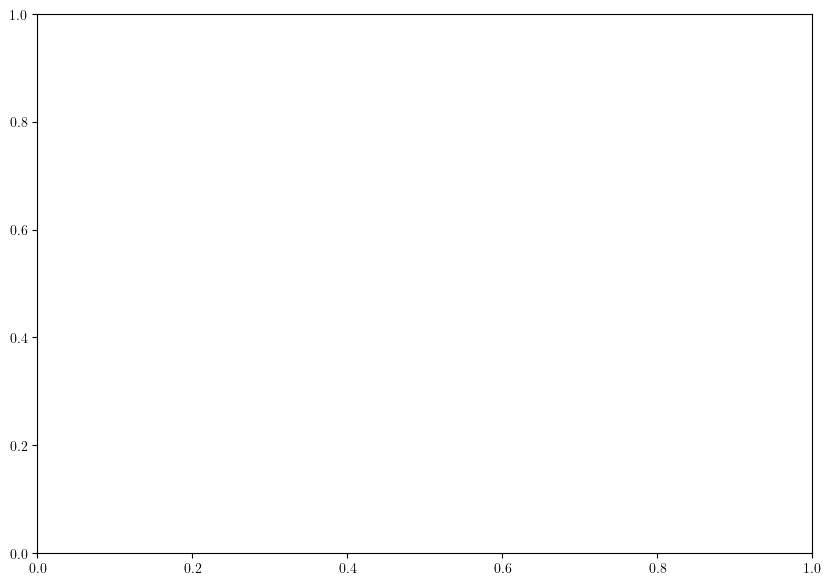

In [ ]:
fontsize = 20
fig, ax = plt.subplots(figsize = (10, 7)) 
ax.plot(K_values, nmse_train, c = 'teal', markersize=10, marker = '.', linestyle='-', label = r"mixed dynamics")
ax.plot(K_values, nmse_train_pandey, c = 'salmon', markersize=10, marker = '.', linestyle='-', label = r"pandey data")
ax.plot(K_values, nmse_train_HC, c = 'darkOrchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e8$")
ax.plot(K_values, nmse_train_Ra1e7, c = 'orchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e7$")
ax.plot(K_values, nmse_train_pureRB, c = 'orange', markersize=10, marker = '.', linestyle='-', label = r"pure RB $Ra = 1e8$")


ax.plot(K_values, NMSE_pca[:len(K_values)], c = 'teal', markersize=10, alpha = 0.3, marker = '.', linestyle='-', )
ax.plot(K_values, NMSE_pca_pandey[:len(K_values)], c = 'salmon', markersize=10, alpha = 0.3, marker = '.', linestyle='-', )
ax.plot(K_values,NMSE_pca_HC[:len(K_values)], c = 'darkOrchid', markersize=10, alpha = 0.3, marker = '.', linestyle='-',)
ax.plot(K_values, NMSE_pca_1e7[:len(K_values)], c = 'orchid', markersize=10, alpha = 0.3, marker = '.', linestyle='-',)
ax.plot(K_values, NMSE_pca_pureRB[:len(K_values)], c = 'orange', markersize=10, alpha = 0.3, marker = '.', linestyle='-',)

# ax.set_title(r"Residual norm")
ax.set_ylabel(r"NMSE", fontsize = fontsize)
ax.set_xlabel(r'$K$ ', fontsize = fontsize)
ax.set_ylim(bottom = 0)

ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_yscale('log') 
ax.set_xscale('log') 
ax.legend(fontsize = fontsize)
ax.set_ylim(bottom = 0)

# fig.suptitle(f'number of modes = {num_modes} ', fontsize = fontsize)
fig.tight_layout()

In [ ]:
K_pandey

array([8.92777431e-05, 1.78555486e-04, 2.67833229e-04, 4.46388715e-04,
       8.92777431e-04, 2.23194358e-03, 4.46388715e-03, 1.14275511e-02,
       2.28551022e-02, 4.46388715e-02, 6.24944201e-02, 7.14221944e-02,
       8.03499688e-02, 8.92777431e-02, 1.78555486e-01, 2.67833229e-01,
       3.57110972e-01, 4.46388715e-01, 5.57896616e-01, 8.92777431e-01,
       1.00000000e+00])

/tmp/ipykernel_643429/1709691192.py:25: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(bottom = 0)


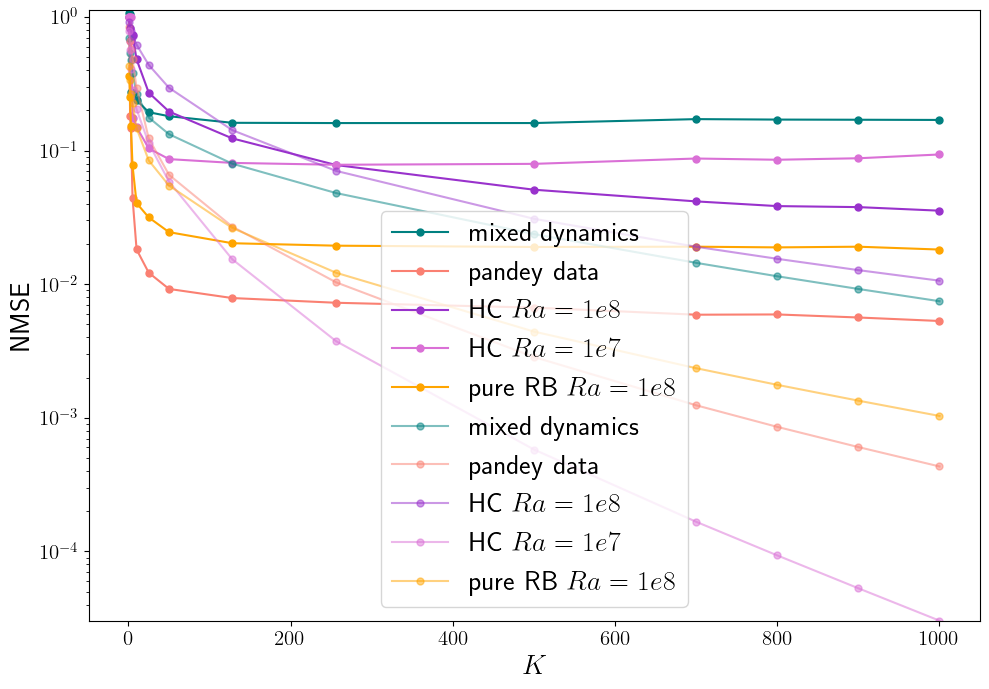

In [ ]:
fontsize = 20
fig, ax = plt.subplots(figsize = (10, 7)) 
ax.plot(K_values, nmse_test, c = 'teal', markersize=10, marker = '.', linestyle='-', label = r"mixed dynamics")
ax.plot(K_values, nmse_test_pandey, c = 'salmon', markersize=10, marker = '.', linestyle='-', label = r"pandey data")
ax.plot(K_values, nmse_test_HC, c = 'darkOrchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e8$")
ax.plot(K_values, nmse_test_Ra1e7, c = 'orchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e7$")
ax.plot(K_values, nmse_test_pureRB, c = 'orange', markersize=10, marker = '.', linestyle='-', label = r"pure RB $Ra = 1e8$")


ax.plot(K_values, NMSE_pca[:len(K_values)], c = 'teal', markersize=10, alpha = 0.5, marker = '.', linestyle='-', label = r"mixed dynamics")
ax.plot(K_values, NMSE_pca_pandey[:len(K_values)], c = 'salmon', markersize=10, alpha = 0.5, marker = '.', linestyle='-', label = r"pandey data")
ax.plot(K_values,NMSE_pca_HC[:len(K_values)], c = 'darkOrchid', markersize=10, alpha = 0.5, marker = '.', linestyle='-', label = r"HC $Ra = 1e8$")
ax.plot(K_values, NMSE_pca_1e7[:len(K_values)], c = 'orchid', markersize=10, alpha = 0.5, marker = '.', linestyle='-', label = r"HC $Ra = 1e7$")
ax.plot(K_values, NMSE_pca_pureRB[:len(K_values)], c = 'orange', markersize=10, alpha = 0.5, marker = '.', linestyle='-', label = r"pure RB $Ra = 1e8$")

# ax.set_title(r"Residual norm")
ax.set_ylabel(r"NMSE", fontsize = fontsize)
ax.set_xlabel(r'$K$ ', fontsize = fontsize)
ax.set_ylim(bottom = 0)

ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_yscale('log') 
# ax.set_xscale('log') 
ax.legend(fontsize = fontsize)
ax.set_ylim(bottom = 0)

# fig.suptitle(f'number of modes = {num_modes} ', fontsize = fontsize)
fig.tight_layout()

In [ ]:
NMSE_pca = [0.6955067022099422,
 0.534258378184433,
 0.4788162951039174,
 0.384012560149645,
 0.2650543192957652,
 0.17675853251165086,
 0.13268473955185145,
 0.0798349404808474,
 0.04811016142633892,
 0.02372146050959682,
 0.014449388602148856,
 0.011468018362941972,
 0.00921345908739675,
 0.007460233096041027,
 0.0015754370770252833,
 0.0007733723048952257,
 0.0006104809422847851,
 0.000581256383121182,
 0.0005772931710731731]

K_values_pca = [1,2,3,5,10,25,50,128,256,500,700, 800, 900,1000,2000,3000,4000, 5000,6249]

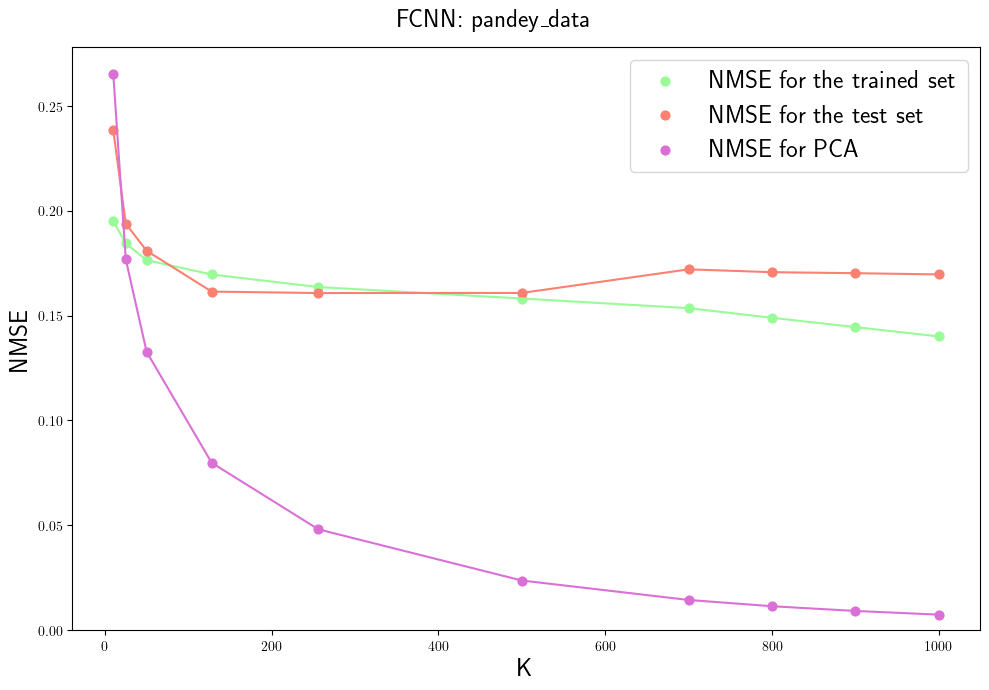

In [ ]:
i = 4
j = len(K_values)
plot_NMSE(K_values, nmse, nmse_train, nmse_test, title="FCNN: pandey_data", i=i, j=j, NMSE_pca=NMSE_pca, K_values_pca=K_values)

# CNN

date: 2024-05-22 17:00:17.690851
batch_size: 4
Lambda: 0.01
thirty_min_epoch: None
num_epoch: 100
depth: 4
lr: 0.0001
weight_decay: 0
execution_time_in_min: 15.964675017197926
Q: 1000
epoch_1: {'loss': 0.005201179999858141, 'nmse': 0.2893808889389038, 'time': 0.18911496798197427, 'average_loss': 0.0031040985918680676, 'nmse_train': 0.4288869248239448}
epoch_2: {'loss': 0.004911109805107117, 'nmse': 0.2691905832290649, 'time': 0.37107459306716917, 'average_loss': 0.0019142871480723274, 'nmse_train': 0.26747758378132985}
epoch_3: {'loss': 0.005918221082538366, 'nmse': 0.24382333636283873, 'time': 0.5581188162167867, 'average_loss': 0.0016343836234763243, 'nmse_train': 0.23043510279648674}
epoch_4: {'loss': 0.004178161732852459, 'nmse': 0.2299991750717163, 'time': 0.7429578900337219, 'average_loss': 0.0014759882569434267, 'nmse_train': 0.20934291925827098}
epoch_5: {'loss': 0.003126076189801097, 'nmse': 0.22049013733863831, 'time': 0.9293178200721741, 'average_loss': 0.0013741217269615175

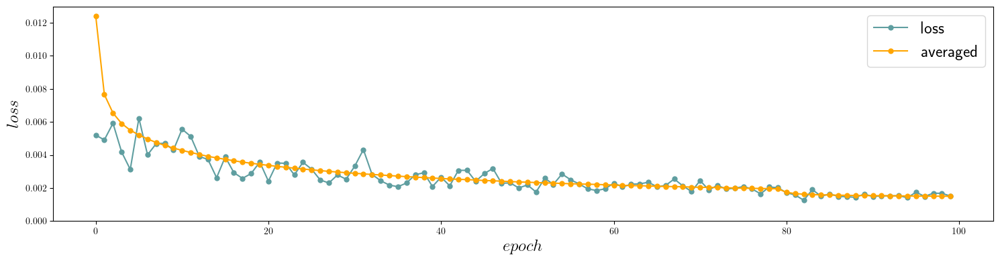

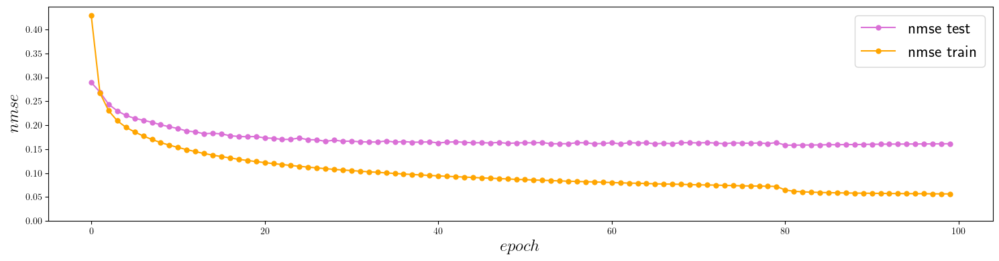

In [ ]:
batch_size = 4
K = 128
title = f'model_bs{batch_size}_K{K}_lr{lr}'
i = 0



from autoencoder_analysis import plot_info_training
plot_info_training(directory, title, i = i)


In [4]:
batch_size = 4

K_values = [1, 2, 3, 5, 10, 25, 50, 128, 256, 500, 700, 800, 900, 1000]
# bs_values = [1, 2, 3, 4, 8, 16]
# directory = f'{current_directory}/results/fcnn/new_architecture/pca_only/'
i = 0



from autoencoder_analysis import get_variables_from_info_text
from utils import losses_from_info



print(directory)

def evaluate(directory, K_values, batch_size, lr):
    nmse_test = []
    nmse_train = []

    plt.ioff()
    for i, K in enumerate(K_values):
        print(f"K = {K}")
        
        title = f'model_K{K}_bs{batch_size}_lr{lr}'
        title = f'model_bs{batch_size}_K{K}_lr{lr}'
        variables, sizes = get_variables_from_info_text(directory, title + '_info.txt')
        epochs, losses, nmse, times, average_loss, nmse_train = losses_from_info(variables)
        print(nmse_train)
        nmse_test.append(nmse[-1])
        nmse_train.append(nmse_train[-1])
    plt.ion()

    return nmse_train, nmse_test

..//results/fcnn/new_architecture/


In [44]:
lr = 1e-4
nc = 8
depth = 4
dynamics = None
pandey_data = False
Ra = 1e8
Lambda = 1e-2


def NMSE_pca_16(Ra, Lambda):
    simulation = Simulation(current_directory, normalize=True, Lambda=Lambda, Ra=Ra)
    time_array, x, z, u, w, T, umean, wmean, Tmean = map(
        lambda x: torch.tensor(x).to(device), simulation.import_data(mean_type="Znorm")
    )
    X = torch.from_numpy(simulation.X).to(device)

    n_min = min(simulation.m, simulation.h *simulation.l)
    K = 16
    U,S,V = torch.pca_lowrank(X, q=K)
    X_reconstructed = U @ torch.diag(S) @ torch.conj(V).t()
    NMSE_pca=compute_nmse_pca(X_reconstructed, X).sum()

    
    K_normalized = 16 / n_min

    return(NMSE_pca, K_normalized)


def directory_to_chose_cnn(Ra, pandey_data, dynamics=None, convnext=False, convnext_kernel=7):
    directory = f'{current_directory}/results/cnn/pandeylike/'


    if convnext:
        directory += "convnext/"

    if Ra == 1e8 and not pandey_data and dynamics==None:
        directory += "Ra1e8/"

    if Ra == 1e7 and not pandey_data:
        directory += "Ra1e7/"

    if Ra == 2e6 and not pandey_data:
        directory += "Ra2e6/"   

    if pandey_data:
        directory += "pandey_data/"

    if convnext_kernel != 7:
        directory += f"kernel{convnext_kernel}/"

    
    if dynamics is not None:
        if dynamics == "HC":
            directory += "/HCRa1e8"
        if dynamics == "pureRB":
            directory += "pureRB"
    return directory

directory = directory_to_chose(Ra, pandey_data, dynamics)   
print(f"directory = {directory}")


def evaluate_cnn(directory, bs_values, nc, lr):
    nmse_test = []
    nmse_train = []

    plt.ioff()
    for i, bs in enumerate(bs_values):
        title = f'model_bs{bs}_nc{nc}_lr{lr}'
        variables, sizes = get_variables_from_info_text(directory, title + '_info.txt')
        epochs, losses, nmse, times, average_loss, nmse_train = losses_from_info(variables)
        print(nmse_train)
        nmse_test.append(nmse[-1])
        nmse_train.append(nmse_train[-1])
    plt.ion()
    return nmse_train, nmse_test    

directory = ..//results/fcnn/Ra1e8/


In [6]:
bs_values = (1, 2, 3, 4, 8, 16)

Ra = 1e8
Lambda = 1e-2
pandey_data = False
dynamics = None
nc = 64
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics)
nmse_train, nmse_test = evaluate_cnn(directory, bs_values, nc, lr)
nmse_pca, K_pca = NMSE_pca_16(Ra, Lambda)

Ra = 1e7
nc = 64
Lambda = 1000.0
pandey_data = False
dynamics = None
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics)
nmse_train_Ra1e7, nmse_test_Ra1e7 = evaluate_cnn(directory, bs_values, nc, lr)
NMSE_pca_1e7, K_pca_1e7 = NMSE_pca_16(Ra, Lambda)


Ra = 1e8
nc = 8
Lambda = 0.0
pandey_data = False
dynamics = "pureRB"
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics)
nmse_train_pureRB, nmse_test_pureRB = evaluate_cnn(directory, bs_values, nc, lr)
nmse_pca_pureRB, K_pca_pureRB = NMSE_pca_16(Ra, Lambda)


Ra = 1e8
pandey_data = False
dynamics = "HC"
Lambda = 1000.0
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics)
nmse_train_HC, nmse_test_HC = evaluate_cnn(directory, bs_values, nc, lr)
nmse_pca_HC, K_pca_HC = NMSE_pca_16(Ra, Lambda)

Ra = 1e8
pandey_data = True
dynamics = None
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics)
nmse_train_pandey, nmse_test_pandey = evaluate_cnn(directory, bs_values, nc, lr)
nmse_pandey, K_pandey = NMSE_pca_16(Ra, Lambda)

date: 2024-06-10 20:22:16.617086
batch_size: 1
size1: (50, 30)
size2: (25, 15)
size3: (13, 8)
size4: (7, 4)
size5: (4, 2)
size6: (2, 1)
Lambda: 0.01
Ra: 100000000.0
lr: 0.0001
weight_decay: 0
execution_time_in_min: 183.20614916086197
epoch_1: {'loss': 0.006732957437634468, 'nmse': 1.3001370763778686, 'time': 1.9117090026537578, 'average_loss': 0.02931996097041037, 'nmse_train': 1.0427409590514718}
epoch_2: {'loss': 0.00921141542494297, 'nmse': 0.5942569518089295, 'time': 3.752116088072459, 'average_loss': 0.009876137465256125, 'nmse_train': 0.34565493995972923}
epoch_3: {'loss': 0.0037763877771794796, 'nmse': 0.4351146650314331, 'time': 5.588725996017456, 'average_loss': 0.00805363918525951, 'nmse_train': 0.2832949589712712}
epoch_4: {'loss': 0.004348136018961668, 'nmse': 0.3445876145362854, 'time': 7.434339515368143, 'average_loss': 0.006986487614521478, 'nmse_train': 0.24723503829786822}
epoch_5: {'loss': 0.004096166230738163, 'nmse': 0.27282641172409056, 'time': 9.281697682539622, '

NameError: name 'compute_nmse_pca' is not defined

NameError: name 'nmse_test_HC' is not defined

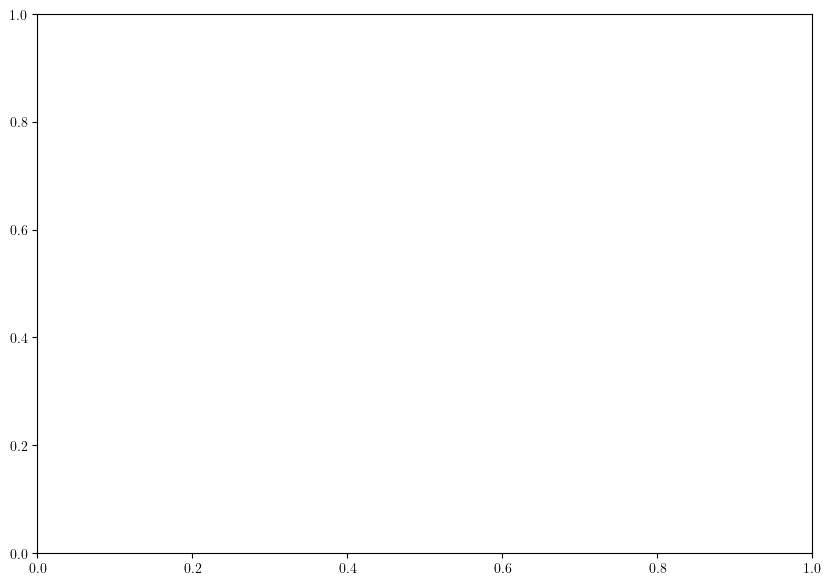

In [24]:
fontsize = 20
fig, ax = plt.subplots(figsize = (10, 7)) 
# ax.plot(bs_values, nmse_test, c = 'teal', markersize=10, marker = '.', linestyle='-', label = r"mixed dynamics")
# ax.plot(bs_values, nmse_test_pandey, c = 'salmon', markersize=10, marker = '.', linestyle='-', label = r"pandey data")
ax.plot(bs_values, nmse_test_HC, c = 'darkOrchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e8$")
ax.plot(bs_values, nmse_test_Ra1e7, c = 'orchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e7$")
# ax.plot(bs_values, nmse_test_pureRB, c = 'orange', markersize=10, marker = '.', linestyle='-', label = r"pure RB $Ra = 1e8$")

# ax.hlines(nmse_pca, 0, 16, linestyle='--', color='teal', alpha=0.7)  
# ax.hlines(nmse_pandey, 0, 16, linestyle='--', color='salmon', alpha=0.7)  
ax.hlines(nmse_pca_HC, 0, 16, linestyle='--', color='darkOrchid', alpha=0.7)  
ax.hlines(NMSE_pca_1e7, 0, 16, linestyle='--', color='orchid', alpha=0.7)  
# ax.hlines(nmse_pca_pureRB, 0, 16, linestyle='--', color='orange', alpha=0.7)  
# ax.plot(K_values, NMSE_pca[:len(K_values)], c = 'teal', markersize=10, alpha = 0.3, marker = '.', linestyle='-', )
# ax.plot(K_values, NMSE_pca_pandey[:len(K_values)], c = 'salmon', markersize=10, alpha = 0.3, marker = '.', linestyle='-', )
# ax.plot(K_values,NMSE_pca_HC[:len(K_values)], c = 'darkOrchid', markersize=10, alpha = 0.3, marker = '.', linestyle='-',)
# ax.plot(K_values, NMSE_pca_1e7[:len(K_values)], c = 'orchid', markersize=10, alpha = 0.3, marker = '.', linestyle='-',)
# ax.plot(K_values, NMSE_pca_pureRB[:len(K_values)], c = 'orange', markersize=10, alpha = 0.3, marker = '.', linestyle='-',)

# ax.set_title(r"Residual norm")
ax.set_ylabel(r"NMSE", fontsize = fontsize)
ax.set_xlabel(r'batch size ', fontsize = fontsize)
ax.set_ylim(bottom = 0)

ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_yscale('log') 
ax.set_xscale('log') 
ax.legend(fontsize = fontsize)
ax.set_ylim(bottom = 0)

# fig.suptitle(f'number of modes = {num_modes} ', fontsize = fontsize)
fig.tight_layout()

In [18]:
nmse_pandey

0.5293460879088233

# Convnext

In [25]:
bs_values = (1, 2, 3, 4, 8, 16)

Ra = 1e8
Lambda = 1e-2
pandey_data = False
dynamics = None
nc = 64
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics, convnext=True)
nmse_train_cn, nmse_test_cn = evaluate_cnn(directory, bs_values, nc, lr)
nmse_pca, K_pca = NMSE_pca_16(Ra, Lambda)

Ra = 1e7
nc = 64
Lambda = 1000.0
pandey_data = False
dynamics = None
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics, convnext=True)
nmse_train_Ra1e7_cn, nmse_test_Ra1e7_cn = evaluate_cnn(directory, bs_values, nc, lr)
NMSE_pca_1e7, K_pca_1e7 = NMSE_pca_16(Ra, Lambda)


Ra = 1e8
nc = 8
Lambda = 0.0
pandey_data = False
dynamics = "pureRB"
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics, convnext=True)
nmse_train_pureRB_cn, nmse_test_pureRB_cn = evaluate_cnn(directory, bs_values[1:], nc, lr)
nmse_pca_pureRB, K_pca_pureRB = NMSE_pca_16(Ra, Lambda)


Ra = 1e8
pandey_data = False
dynamics = "HC"
Lambda = 1000.0
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics, convnext=True)
nmse_train_HC_cn, nmse_test_HC_cn = evaluate_cnn(directory, bs_values, nc, lr)
nmse_pca_HC, K_pca_HC = NMSE_pca_16(Ra, Lambda)

Ra = 1e8
pandey_data = True
dynamics = None
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics, convnext=True)
nmse_train_pandey_cn, nmse_test_pandey_cn = evaluate_cnn(directory, bs_values, nc, lr)
nmse_pandey, K_pandey = NMSE_pca_16(Ra, Lambda)

date: 2024-06-17 14:07:01.262438
batch_size: 1
size1: (50, 30)
size2: (25, 15)
size3: (13, 8)
size4: (7, 4)
size5: (4, 2)
size6: (2, 1)
Lambda: 0.01
Ra: 100000000.0
lr: 0.0001
weight_decay: 0
execution_time_in_min: 184.34297065734864
group: Ra1e8
wandb_on: True
convnext: True
pandey: True
epoch_1: {'loss': 0.010406294837594032, 'nmse': 1.47416974067688, 'time': 1.9354947090148926, 'average_loss': 0.022092993596732977, 'nmse_train': 0.7724906074977447}
epoch_2: {'loss': 0.006369148846715689, 'nmse': 1.0139201879501343, 'time': 3.7668458302815755, 'average_loss': 0.013690436126764965, 'nmse_train': 0.46924296665041154}
epoch_3: {'loss': 0.005808343179523945, 'nmse': 1.0060513019561768, 'time': 5.597656985123952, 'average_loss': 0.011421808343972537, 'nmse_train': 0.3921701361055606}
epoch_4: {'loss': 0.006622185930609703, 'nmse': 1.3832311725616455, 'time': 7.432790744304657, 'average_loss': 0.010400540919026894, 'nmse_train': 0.3579785216726882}
epoch_5: {'loss': 0.007586807012557983, '

NameError: name 'nmse_test_HC' is not defined

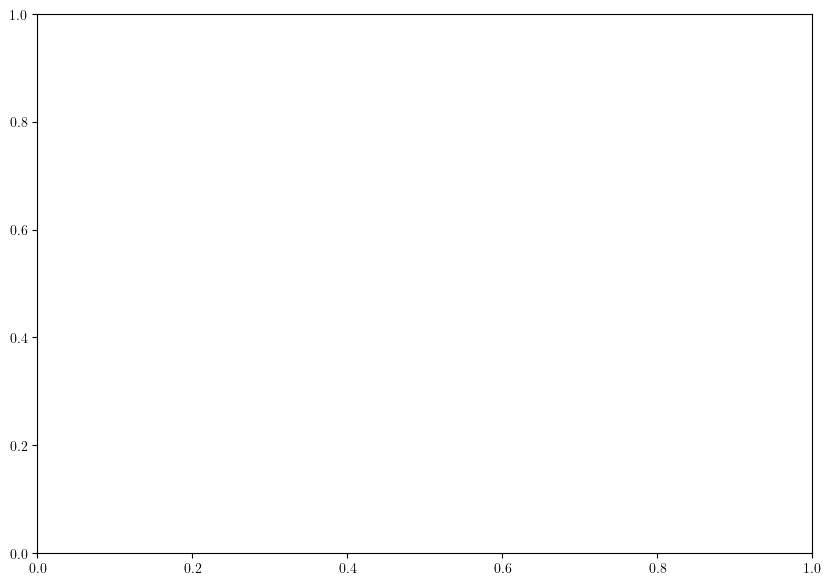

In [26]:
fontsize = 20
fig, ax = plt.subplots(figsize = (10, 7)) 
# ax.plot(bs_values, nmse_test, c = 'teal', markersize=10, marker = '.', linestyle='dotted',alpha = 0.7)
# ax.plot(bs_values, nmse_test_pandey, c = 'salmon', markersize=10, marker = '.', linestyle='dotted', alpha = 0.7)
ax.plot(bs_values, nmse_test_HC, c = 'darkOrchid', markersize=10, marker = '.', linestyle='dotted',  alpha = 0.7)
ax.plot(bs_values, nmse_test_Ra1e7, c = 'orchid', markersize=10, marker = '.', linestyle='dotted', alpha = 0.7)
# ax.plot(bs_values, nmse_test_pureRB, c = 'orange', markersize=10, marker = '.', linestyle='dotted',alpha = 0.7)


# ax.plot(bs_values, nmse_test_cn, c = 'teal', markersize=10, marker = '.', linestyle='-', label = r"mixed dynamics")
# ax.plot(bs_values, nmse_test_pandey_cn, c = 'salmon', markersize=10, marker = '.', linestyle='-', label = r"pandey data")
ax.plot(bs_values, nmse_test_HC_cn, c = 'darkOrchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e8$")
ax.plot(bs_values, nmse_test_Ra1e7_cn, c = 'orchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e7$")
# ax.plot(bs_values[1:], nmse_test_pureRB_cn, c = 'orange', markersize=10, marker = '.', linestyle='-', label = r"pure RB $Ra = 1e8$")

# ax.hlines(nmse_pca, 0, 16, linestyle='--', color='teal', alpha=0.7)  
# ax.hlines(nmse_pandey, 0, 16, linestyle='--', color='salmon', alpha=0.7)  
ax.hlines(nmse_pca_HC, 0, 16, linestyle='--', color='darkOrchid', alpha=0.7)  
ax.hlines(NMSE_pca_1e7, 0, 16, linestyle='--', color='orchid', alpha=0.7)  
# ax.hlines(nmse_pca_pureRB, 0, 16, linestyle='--', color='orange', alpha=0.7)  

# ax.set_title(r"Residual norm")
ax.set_ylabel(r"NMSE", fontsize = fontsize)
ax.set_xlabel(r'batch size ', fontsize = fontsize)
ax.set_ylim(bottom = 0)

ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_yscale('log') 
ax.set_xscale('log') 
ax.legend(fontsize = fontsize)
ax.set_ylim(bottom = 0)

# fig.suptitle(f'number of modes = {num_modes} ', fontsize = fontsize)
fig.tight_layout()

In [60]:
Ra = 1e8
Lambda = 1e-2
pandey_data = False
dynamics = None
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics, convnext=True) + "kernel5/"
nmse_train_cn5, nmse_test_cn5 = evaluate_cnn(directory, bs_values, nc, lr)
nmse_pca, K_pca = NMSE_pca_16(Ra, Lambda)

Ra = 1e8
Lambda = 1e-2
pandey_data = False
dynamics = None
nc = 8
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics, convnext=True) + "kernel9/"
nmse_train_cn9, nmse_test_cn9 = evaluate_cnn(directory, bs_values, nc, lr)
nmse_pca, K_pca = NMSE_pca_16(Ra, Lambda)

date: 2024-06-20 01:43:49.117231
batch_size: 1
size1: (50, 30)
size2: (25, 15)
size3: (13, 8)
size4: (7, 4)
size5: (4, 2)
size6: (2, 1)
Lambda: 0.01
Ra: 100000000.0
lr: 0.0001
kernel_size: 5
weight_decay: 0
execution_time_in_min: 206.97688494126
group: Ra1e8
wandb_on: True
convnext: True
pandey: True
epoch_1: {'loss': 0.019129252061247826, 'nmse': 50.83670647526993, 'time': 2.159584466616313, 'average_loss': 0.022255179116072884, 'nmse_train': 0.7853973603955382}
epoch_2: {'loss': 0.018813343718647957, 'nmse': 34.16256672402423, 'time': 4.251831777890524, 'average_loss': 0.013446097317309554, 'nmse_train': 0.46499486075370555}
epoch_3: {'loss': 0.005284206010401249, 'nmse': 14.894846685601532, 'time': 6.341349649429321, 'average_loss': 0.011455037980880675, 'nmse_train': 0.39694500957885576}
epoch_4: {'loss': 0.021994197741150856, 'nmse': 14.04465750988664, 'time': 8.409812422593435, 'average_loss': 0.01072408215392868, 'nmse_train': 0.3716136326521258}
epoch_5: {'loss': 0.008777370676

/tmp/ipykernel_1984472/2233319836.py:33: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(bottom = 0)


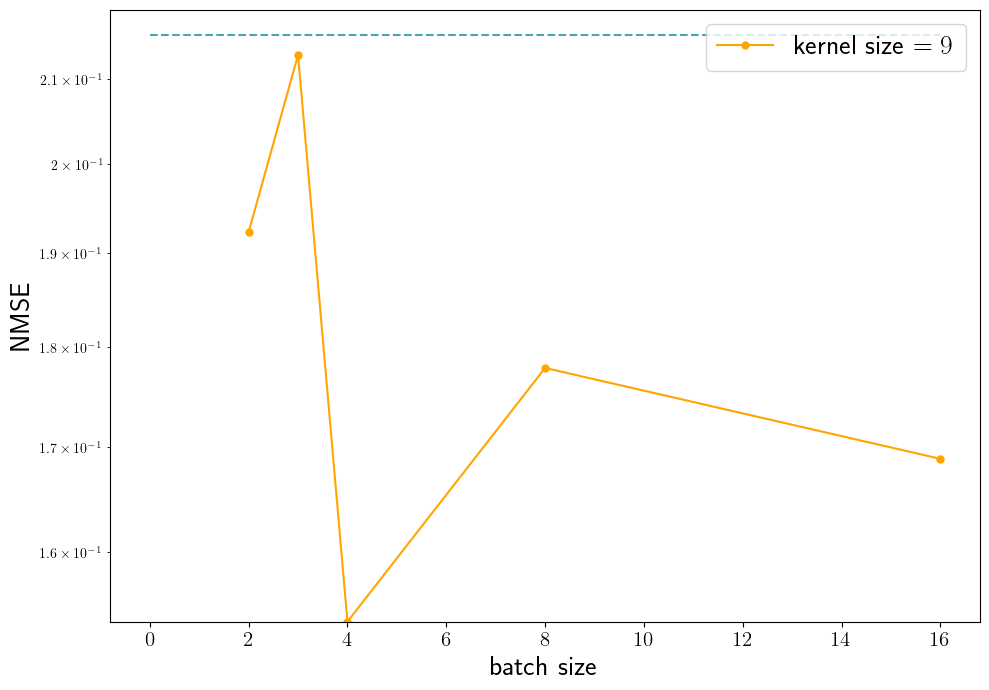

In [66]:
fontsize = 20
fig, ax = plt.subplots(figsize = (10, 7)) 
ax.plot(bs_values, nmse_test, c = 'teal', markersize=10, marker = '.', linestyle='dotted',alpha = 0.7)
# ax.plot(bs_values, nmse_test_pandey, c = 'salmon', markersize=10, marker = '.', linestyle='dotted', alpha = 0.7)
# ax.plot(bs_values, nmse_test_HC, c = 'darkOrchid', markersize=10, marker = '.', linestyle='dotted',  alpha = 0.7)
# ax.plot(bs_values, nmse_test_Ra1e7, c = 'orchid', markersize=10, marker = '.', linestyle='dotted', alpha = 0.7)
# ax.plot(bs_values, nmse_test_pureRB, c = 'orange', markersize=10, marker = '.', linestyle='dotted',alpha = 0.7)


# ax.plot(bs_values, nmse_test_cn, c = 'teal', markersize=10, marker = '.', linestyle='-', label = r"kernel size $= 7$")
# ax.plot(bs_values, nmse_test_cn5, c = 'orchid', markersize=10, marker = '.', linestyle='-', label = r"kernel size $= 5$")
ax.plot(bs_values[i:], nmse_test_cn9[i:], c = 'orange', markersize=10, marker = '.', linestyle='-', label = r"kernel size $= 9$")
# ax.plot(bs_values, nmse_test_pandey_cn, c = 'salmon', markersize=10, marker = '.', linestyle='-', label = r"pandey data")
# ax.plot(bs_values, nmse_test_HC_cn, c = 'darkOrchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e8$")
# ax.plot(bs_values, nmse_test_Ra1e7_cn, c = 'orchid', markersize=10, marker = '.', linestyle='-', label = r"HC $Ra = 1e7$")
# ax.plot(bs_values[1:], nmse_test_pureRB_cn, c = 'orange', markersize=10, marker = '.', linestyle='-', label = r"pure RB $Ra = 1e8$")

ax.hlines(nmse_pca, 0, 16, linestyle='--', color='teal', alpha=0.7)  
# ax.hlines(nmse_pandey, 0, 16, linestyle='--', color='salmon', alpha=0.7)  
# ax.hlines(nmse_pca_HC, 0, 16, linestyle='--', color='darkOrchid', alpha=0.7)  
# ax.hlines(NMSE_pca_1e7, 0, 16, linestyle='--', color='orchid', alpha=0.7)  
# ax.hlines(nmse_pca_pureRB, 0, 16, linestyle='--', color='orange', alpha=0.7)  

# ax.set_title(r"Residual norm")
ax.set_ylabel(r"NMSE", fontsize = fontsize)
ax.set_xlabel(r'batch size ', fontsize = fontsize)
ax.set_ylim(bottom = 0)

ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_yscale('log') 
ax.legend(fontsize = fontsize)
ax.set_ylim(bottom = 0)

# fig.suptitle(f'number of modes = {num_modes} ', fontsize = fontsize)
fig.tight_layout()

# GIF

In [8]:
K=16
X = torch.from_numpy(simulation.X).to(device)
U,S,V = torch.pca_lowrank(X, q=K)
X_reconstructed = U @ torch.diag(S) @ torch.conj(V).t()
X_reconstructed = X_reconstructed[int(training_ratio*simulation.m):]
print(X_reconstructed.shape)

torch.Size([625, 12393])


In [6]:
lr = 1e-4
nc = 8
depth = 4
dynamics = None
pandey_data = False
Ra = 1e8
Lambda = 1e-2
batch_size = 4
training_ratio = 0.9
pandey_data = None

def directory_to_chose(Ra, pandey_data, dynamics=None):
    directory = f'{current_directory}/results/fcnn/'


    if Ra == 1e8 and not pandey_data:
        directory += "Ra1e8/"

    if Ra == 1e7 and not pandey_data:
        directory += "Ra1e7/"

    if Ra == 2e6 and not pandey_data:
        directory += "Ra2e6/"   

    if pandey_data:
        directory += "pandey_data/"

    if dynamics is not None:
        if dynamics == "HC":
            directory = f"{current_directory}/results/fcnn/HCRa1e8"
        if dynamics == "pureRB":
            directory = f"{current_directory}/results/fcnn/pureRB"
        group = dynamics
    return directory

directory = directory_to_chose(Ra, pandey_data, dynamics)   
print(f"directory = {directory}")

directory = ..//results/fcnn/Ra1e8/


In [36]:
if pandey_data:
    simulation = Simulation(current_directory, normalize=True, Lambda=Lambda, Ra=Ra, pandey=pandey_data)
    simulation.import_data_pandey(mean_type="scaled")

else:
    simulation = Simulation(current_directory, normalize=True, Lambda=Lambda, Ra=Ra)
    time_array, x, z, u, w, T, umean, wmean, Tmean = map(
        lambda x: torch.tensor(x).to(device), simulation.import_data(mean_type="scaled")
    )
    simulation.image_rgb()
training_ratio = 0.9
X = torch.from_numpy(np.swapaxes(simulation.X[: int(training_ratio * simulation.m)], 0, 1)).to(device)

data from ..//data/bulk_L0.01_Ra8.npz
X shape (6249, 12393)


In [37]:
from autoencoder import SimuDataset
import torch
from torch.utils.data import DataLoader
from fcnn import fcnn
from cnn import CNN_pandeylike



def apply_fcnn(directory, simulation, K, Ra,  batch_size=4, title=None, pandey_data=False, lr=1e-4, nc=8, depth=4, training_ratio=0.9):

    test_set = SimuDataset(simulation, device, rgb=False, mode="test", training_ratio=training_ratio)
    test_loader = DataLoader(dataset=test_set, batch_size=batch_size, shuffle=False)

    Q = 1000
    depth = 4
    batch_size = 4
    U, S, V = torch.pca_lowrank(X, q=Q)
    print("SVD")
    print(f"Q = {Q}")
    # print(U.shape, S.shape, V.shape)
    U = U.to(torch.float32)
    V = V.to(torch.float32)
    S = S.to(torch.float32)
    print(f"U shape : {U.shape}")

    model = fcnn(device=device, N=Q, U=U, S=S, K=K, depth=depth)
    model.to(device)

    model.load_state_dict(torch.load(directory + f'model_K{K}_bs{batch_size}_lr{lr}.pt'))
    model.eval()  # Set the model to evaluation mode

    with torch.no_grad():
        encoded_data_batch = []
        decoded_data_batch = []

    for x, t in test_loader:
        x = x.to(device).float()
        # encoded_data = model.encoder(x)
        # encoded_data = model.linear_encoder(torch.reshape(encoded_data,  (encoded_data.shape[0],-1)))

        # decoded_data = model.linear_decoder(encoded_data)
        # decoded_data = model.decoder(torch.reshape(decoded_data, (decoded_data.shape[0], model.n_channels, model.sizes[-1][0], model.sizes[-1][1])))
        decoded_data = model.forward(x)
        # encoded_data_batch.append(encoded_data)
        decoded_data_batch.append(decoded_data)

    # encoded_data_batch = torch.cat(encoded_data_batch, dim=0)
    decoded_data_batch = torch.cat(decoded_data_batch, dim=0)

    return decoded_data_batch

def apply_cnn(directory, simulation, convnext=True, kernel_size=5, batch_size=4, title=None, pandey_data=False, lr=1e-4, nc=8, depth=4, training_ratio=0.9):

    test_set = SimuDataset(simulation, device, rgb=True, mode="test", training_ratio=training_ratio)
    test_loader = DataLoader(dataset=test_set, batch_size=batch_size, shuffle=False)

    size1 = (50, 30)
    size2 = (25, 15)
    size3 = (13, 8)
    size4 = (7, 4)
    size5 = (4, 2)
    size6 = (2, 1)
    sizes = [size1, size2, size3, size4, size5, size6]

    model = CNN_pandeylike(device=device, n_channels=8, sizes=sizes, convnext=convnext, kernel_size=kernel_size, pandey_data=pandey_data, h=simulation.h, l=simulation.l)
    model.to(device)

    model.load_state_dict(torch.load(directory + f'model_bs{batch_size}_nc{nc}_lr{lr}.pt'))
    model.eval()  # Set the model to evaluation mode

    with torch.no_grad():
        encoded_data_batch = []
        decoded_data_batch = []

    for x, t in test_loader:
        x = x.to(device).float()
        encoded_data = model.encoder(x)
        # encoded_data = model.linear_encoder(torch.reshape(encoded_data,  (encoded_data.shape[0],-1)))

        # decoded_data = model.linear_decoder(encoded_data)
        # decoded_data = model.decoder(torch.reshape(decoded_data, (decoded_data.shape[0], model.n_channels, model.sizes[-1][0], model.sizes[-1][1])))
        # decoded_data = model.forward(x)
        decoded_data = model.decoder(encoded_data)
        # encoded_data_batch.append(encoded_data)
        decoded_data_batch.append(decoded_data)

    # encoded_data_batch = torch.cat(encoded_data_batch, dim=0)
    decoded_data_batch = torch.cat(decoded_data_batch, dim=0)

    return decoded_data_batch

In [38]:
K=16
title = f'model_bs{batch_size}_K{K}_lr{lr}'
directory_to_chosetest = directory_to_chose(Ra, pandey_data, dynamics)
print(directory_to_chosetest)
decoded_data = apply_fcnn(directory_to_chosetest, simulation, K, Ra, batch_size=batch_size, pandey_data=pandey_data, lr=lr, nc=nc, depth=depth, training_ratio=training_ratio)

..//results/fcnn/Ra1e8/
pandey_data = False
rgb = False
X SHAPE (625, 12393)
SVD
Q = 1000
U shape : torch.Size([12393, 1000])


In [91]:
directory = directory_to_chose_cnn(Ra, pandey_data, dynamics, convnext=True)
print(directory)
decoded_data = apply_cnn(directory, simulation, convnext=True, kernel_size=7, batch_size=4, title=None, pandey_data=False, lr=1e-4, nc=64, depth=4, training_ratio=0.9)

..//results/cnn/pandeylike/convnext/Ra1e8/
pandey_data = False
rgb = True
X SHAPE (625, 3, 81, 51)
kernel size inside algo 7


In [99]:
print(decoded_data.shape)
X_reconstructed = decoded_data.cpu().detach().numpy()
X_reconstructed = -X_reconstructed/X_reconstructed.min()
U_reconstructed = X_reconstructed[:,0,:,:]
W_reconstructed = X_reconstructed[:,1,:,:]
T_reconstructed = X_reconstructed[:,2,:,:]


torch.Size([625, 3, 81, 51])


In [101]:
X_reconstructed.max()

0.97004336

In [10]:
import matplotlib.gridspec as gridspec
def plot_field(simulation, X_reconstructed, t, training_ratio=0.9,t_min=0, t_max=6249, normalization=None, save=False, directory=None, U_reconstructed=None, W_reconstructed=None, T_reconstructed=None):
    fig = plt.figure(figsize=(18, 6))  # Increase figsize for better aspect ratio
    gs = gridspec.GridSpec(3, 2, width_ratios=[1, 0.02], hspace = 0.2, wspace=0.02)

    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[1, 0])
    ax3 = fig.add_subplot(gs[2, 0])
    cax = fig.add_subplot(gs[:, 1])

    u, w, T = simulation.uwt_from_X()
    u = np.reshape(u, (simulation.m, simulation.h, simulation.l))[int(training_ratio * simulation.m):]
    w = np.reshape(w, (simulation.m, simulation.h, simulation.l))[int(training_ratio * simulation.m):]
    T = np.reshape(T, (simulation.m, simulation.h, simulation.l))[int(training_ratio * simulation.m):]

    if U_reconstructed is None:
        U_reconstructed = X_reconstructed[:, :simulation.h * simulation.l]
        W_reconstructed = X_reconstructed[:, simulation.h * simulation.l:2 * simulation.h * simulation.l]
        T_reconstructed = X_reconstructed[:, 2 * simulation.h * simulation.l:]

        U_reconstructed = np.reshape(U_reconstructed, (int((1-training_ratio) * simulation.m)+1, simulation.h, simulation.l))
        W_reconstructed = np.reshape(W_reconstructed, (int((1-training_ratio) * simulation.m)+1, simulation.h, simulation.l))
        T_reconstructed = np.reshape(T_reconstructed, (int((1-training_ratio) * simulation.m)+1, simulation.h, simulation.l))

    vmin = T[t_min:t_max, :, :].min()
    vmax = T[t_min:t_max, :, :].max()
    vmin_reconstructed = T_reconstructed[t_min:t_max, :, :].min()
    vmax_reconstructed = T_reconstructed[t_min:t_max, :, :].max()

    abs_max = max(abs(vmin), abs(vmax))
    abs_max_reconstructed = max(abs(vmin_reconstructed), abs(vmax_reconstructed))
    maximum_value = max(abs_max, abs_max_reconstructed)

    nmse_u = u - U_reconstructed
    nmse_w = w - W_reconstructed
    nmse_T = T - T_reconstructed

    ax1.streamplot(
        simulation.x.T,
        simulation.z.T,
        u[t, :, :].T,
        w[t, :, :].T,
        color="k",
        arrowsize=0.7,
        linewidth=1,
        density=1.5
    )
    ax2.streamplot(
        simulation.x.T,
        simulation.z.T,
        U_reconstructed[t, :, :].T,
        W_reconstructed[t, :, :].T,
        color="k",
        arrowsize=0.7,
        linewidth=1,
        density=1.5
    )
    ax3.streamplot(
        simulation.x.T,
        simulation.z.T,
        nmse_u[t, :, :].T,
        nmse_w[t, :, :].T,
        color="k",
        arrowsize=0.7,
        linewidth=1,
        density=1.5
    )

    levels = np.linspace(vmin, vmax, 20)
    cf0 = ax1.contourf(
        simulation.x,
        simulation.z,
        T[t, :, :],
        levels=levels,
        cmap=plt.cm.Spectral.reversed(),
        norm=matplotlib.colors.Normalize(vmin=-maximum_value, vmax=maximum_value),
    )
    cf1 = ax2.contourf(
        simulation.x,
        simulation.z,
        T_reconstructed[t, :, :],
        levels=levels,
        cmap=plt.cm.Spectral.reversed(),
        norm=matplotlib.colors.Normalize(vmin=-maximum_value, vmax=maximum_value),
    )
    cf2 = ax3.contourf(
        simulation.x,
        simulation.z,
        nmse_T[t, :, :],
        cmap=plt.cm.Spectral.reversed(),
        norm=matplotlib.colors.Normalize(vmin=-maximum_value, vmax=maximum_value)
    )

    # Create a single colorbar for the entire figure
    cbar = fig.colorbar(cf0, cax=cax, aspect=6, ticks=[-maximum_value, 0, maximum_value], orientation = 'vertical', pad= 0.1)
    cbar.ax.set_aspect('auto')

    ax1.set_aspect("equal")
    ax1.set_ylim(0, 1)
    ax1.set_xlim(-4, 4)
    ax2.set_aspect("equal")
    ax2.set_ylim(0, 1)
    ax2.set_xlim(-4, 4)
    ax3.set_aspect("equal")
    ax3.set_ylim(0, 1)
    ax3.set_xlim(-4, 4)
    ax1.tick_params(axis='both', which='both', bottom=False, top=False,labelbottom=False, labelleft=False)
    ax2.tick_params(axis='both', which='both', bottom=False, top=False,labelbottom=False, labelleft=False)
    ax3.tick_params(axis='both', which='both', bottom=False, top=False,labelbottom=False, labelleft=False)
    ax1.set_title(r"ground truth", fontsize = 20)
    ax2.set_title(r"reconstruction", fontsize = 20)
    ax3.set_title(r"difference", fontsize = 20)
    # plt.tight_layout()

    if save:
        plt.savefig(directory, dpi=300, bbox_inches='tight')
        plt.close()
    else:
        plt.show()

In [31]:
6249*0.9 + 625 - 5940

309.10000000000036

In [ ]:
plot_field(simulation, decoded_data.cpu().detach().numpy(), t, save=False, directory=f"{current_directory}/presentation/fcnn/snapshots/snapshot_{t}")

In [22]:
X_reconstructed.shape

torch.Size([5624, 12393])

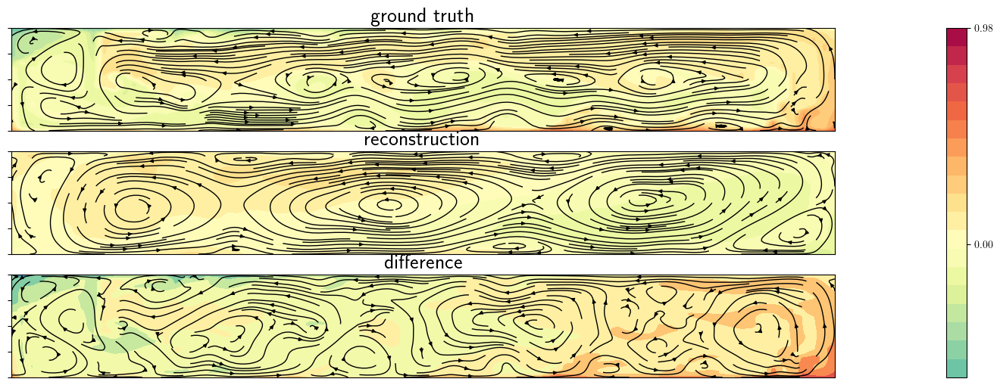

In [11]:
t=335
plot_field(simulation, X_reconstructed.cpu().numpy(), t, save=False, directory=f"{current_directory}/presentation/fcnn/snapshots/snapshot_{t}")

In [12]:
t = 291
for t in range(310, 360):
    plot_field(simulation, X_reconstructed.cpu().numpy(), t, save=True, directory=f"{current_directory}/presentation/pca/snapshots/snapshot_{t}")

In [32]:
t = 291
for t in range(310, 360):
    plot_field(simulation, decoded_data.cpu().detach().numpy(), t, save=True, directory=f"{current_directory}/presentation/fcnn/snapshots/snapshot_{t}")

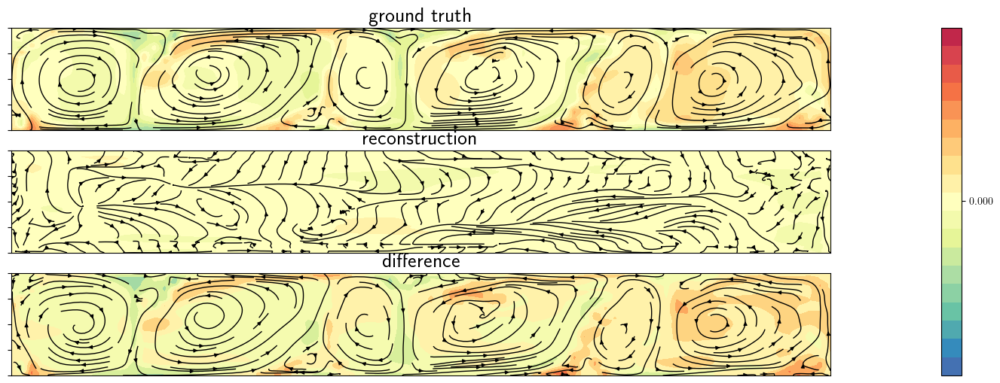

In [103]:
plot_field(simulation, X_reconstructed, t, U_reconstructed=U_reconstructed, W_reconstructed=W_reconstructed, T_reconstructed=T_reconstructed, save=False, directory=f"{current_directory}/presentation/cnn/snapshots/snapshot_{t}")

In [13]:
import utils
importlib.reload(utils)
from utils import make_movie
make_movie(f"{current_directory}/presentation/pca/snapshots/", f"{current_directory}/presentation/pca/pca_ra1e8_K{K}.mp4", fps=10)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (3961, 1528) to (3968, 1536) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x5969940] Warning: data is not aligned! This can lead to a speed loss


# UZ

In [16]:
def UZ(u):
    uz = np.mean(np.mean(u[:,:,25:51], axis = 2), axis = 1)
    uzmean = np.mean(uz)
    return uz, uzmean

In [39]:
X_reconstructed = decoded_data.cpu().detach().numpy()
# X_reconstructed = X_reconstructed.numpy()
U_reconstructed = X_reconstructed[:, :simulation.h * simulation.l]
U_reconstructed = np.reshape(U_reconstructed, (int((1-training_ratio) * simulation.m)+1, simulation.h, simulation.l))
uz_reconstructed, uzmean_reconstructed = UZ(U_reconstructed)

In [12]:
np.argmin(uz)

335

In [21]:
uz, uzmean = UZ(simulation.u[int(training_ratio * simulation.m):])

In [43]:
def plot_uz(uz, uzmean, simu, uz_reconstructed, uzmean_reconstructed, t, normalization = None, save=False, directory=None):
        fontsize = 25
        fig, ax1 = plt.subplots(figsize=(15, 5))
        stretch = 700
        time = simu.time[int(training_ratio * simulation.m):]
        ax1.scatter(time, uz - uzmean, s = 20, c = 'orange', label = r'ground truth')
        ax1.scatter(time, uz_reconstructed - uzmean_reconstructed, s = 15, c = 'darkmagenta', label = r'reconstructed')

        ax1.set_ylabel(r'$u_z$', fontsize= fontsize)
        ax1.set_xlabel(r'$t$', fontsize = fontsize)
        ax1.legend(fontsize = fontsize, loc = 'upper left')

        ax1.tick_params(axis='both', which='both', labelsize=15)
        # fig.suptitle(r"$u_{z>0.5}$" + r" and field at $t_i = {}$".format(t), fontsize = fontsize)
        # plt.subplots_adjust(hspace=0.)
        if save:
            plt.savefig(directory, dpi=300)
            plt.close()
        else:
            # plt.tight_layout()
            plt.show()

In [134]:
uz.shape

(625,)

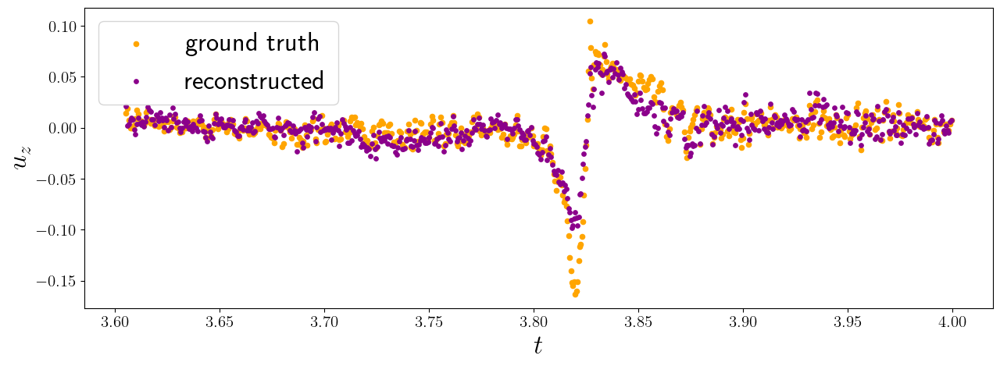

In [44]:
plot_uz(uz, uzmean, simulation, uz_reconstructed, uzmean_reconstructed, t, directory=f"{current_directory}/presentation/fcnn/uz/uz_{t}")

In [163]:
uzmean_reconstructed

-0.0481186

In [146]:
uz_reconstructed

(array([ 0.08015302,  0.00620596, -0.00506714, ...,  0.00602894,
        -0.00282385,  0.02523428], dtype=float32),
 0.00013579529)

In [18]:
def NMSE_pca_16(Ra, Lambda):
    simulation = Simulation(current_directory, normalize=True, Lambda=Lambda, Ra=Ra)
    time_array, x, z, u, w, T, umean, wmean, Tmean = map(
        lambda x: torch.tensor(x).to(device), simulation.import_data(mean_type="Znorm")
    )
    
    X = torch.from_numpy(simulation.X).to(device)

    n_min = min(simulation.m, simulation.h *simulation.l)
    K = 16
    U,S,V = torch.pca_lowrank(X, q=K)
    X_reconstructed = U @ torch.diag(S) @ torch.conj(V).t()
    NMSE_pca=compute_nmse_pca(X_reconstructed, X).sum()

    
    K_normalized = 16 / n_min

    return(NMSE_pca, K_normalized)

In [24]:
Ra = 1e7
Lambda = 1000.0
NMSE_pca_16(Ra, Lambda)

data from ..//data/bulk_L1000.0_Ra7.npz
X shape (2302, 12393)


(0.1544419713450627, 0.0069504778453518675)

In [25]:

simulation = Simulation(current_directory, normalize=True, Lambda=Lambda, Ra=Ra, pandey=pandey_data)
simulation.import_data_pandey(mean_type="scaled")

mean uytheta 0.00490462563906853


In [26]:

X = torch.from_numpy(simulation.X).to(device)

n_min = min(simulation.m, simulation.h *simulation.l)
K = 16
U,S,V = torch.pca_lowrank(X, q=K)
X_reconstructed = U @ torch.diag(S) @ torch.conj(V).t()
NMSE_pca=compute_nmse_pca(X_reconstructed, X).sum()


In [27]:
NMSE_pca

0.19387772964407604